In [1]:
import pandas as pd
import numpy as np
import sys
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df_info = pd.read_csv('../dataset/tbl_DistancesJours.csv',sep=';')
df_info

,vehicle_id,date,total_distance
0,102,23/01/2023,"235903,5408"
1,102,24/01/2023,"170440,3737"
2,102,25/01/2023,"351584,6563"
3,102,26/01/2023,"420269,3229"
4,102,27/01/2023,"160746,3085"
...,...,...,...
15729,197,05/09/2023,"29101,9679"
15730,197,08/09/2023,"14818,80806"
15731,197,11/09/2023,"292531,5143"
15732,197,12/09/2023,"587744,3653"


In [3]:
sys.path.append('../')

from cool_train.data_loading import correct_column_types

train_nb = '181'

# df = pd.read_csv('../dataset/data_cleaned.csv', index_col=[0])
df = pd.read_csv(f'../dataset/train_{train_nb}/train_{train_nb}.csv',sep=';')
df = pd.read_csv(f'../dataset/train_{train_nb}/df_filter2.csv', index_col=[0])

df = correct_column_types(df)
df

,timestamps_UTC,lat,lon,RS_E_RPM_PC1,RS_E_RPM_PC2,RS_E_InAirTemp_PC1,RS_E_InAirTemp_PC2,RS_E_OilPress_PC1,RS_E_OilPress_PC2,RS_E_WatTemp_PC1,RS_E_WatTemp_PC2,RS_T_OilTemp_PC1,RS_T_OilTemp_PC2
0,2023-08-25 08:40:11,51.167318,4.768149,1837.0,1851.0,45.0,39.0,420.0,341.0,88.0,88.0,84.0,87.0
1,2023-08-25 08:52:14,51.188465,4.846686,759.0,794.0,43.0,32.0,203.0,200.0,84.0,88.0,81.0,87.0
2,2023-08-02 14:05:52,51.034942,3.711887,1240.0,1292.0,42.0,33.0,396.0,338.0,83.0,87.0,77.0,85.0
3,2023-08-02 02:08:11,50.769412,3.871828,801.0,798.0,20.0,18.0,510.0,489.0,42.0,46.0,25.0,30.0
4,2023-08-02 02:57:49,50.769818,3.872029,801.0,802.0,26.0,22.0,317.0,289.0,72.0,71.0,61.0,62.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
265489,2023-03-02 19:14:43,51.035736,3.711618,802.0,796.0,28.0,9.0,244.0,217.0,81.0,82.0,77.0,84.0
265490,2023-03-02 21:25:34,50.860273,3.613172,799.0,802.0,36.0,21.0,224.0,203.0,83.0,90.0,84.0,92.0
265491,2023-03-03 02:32:22,50.855451,3.606423,797.5,799.5,14.0,5.0,276.0,267.0,76.0,71.0,66.0,65.5
265492,2023-03-03 03:27:23,50.851097,3.601409,800.0,802.0,11.0,6.0,282.0,262.0,72.0,70.0,69.0,69.0


In [4]:
# Select interesting columns
selected_cols = ['timestamps_UTC','lon','lat',
                 'RS_E_InAirTemp_PC1', 'RS_E_InAirTemp_PC2',
                 'RS_E_OilPress_PC1','RS_E_OilPress_PC2',
                 'RS_E_RPM_PC1','RS_E_RPM_PC2',
                 'RS_E_WatTemp_PC1','RS_E_WatTemp_PC2',
                 'RS_T_OilTemp_PC1','RS_T_OilTemp_PC2']

df_sel  = df[selected_cols]

In [5]:
# Correlation matrix
selected_cols_corr = ['RS_E_InAirTemp_PC1', 'RS_E_InAirTemp_PC2',
                 'RS_E_OilPress_PC1','RS_E_OilPress_PC2',
                 'RS_E_RPM_PC1','RS_E_RPM_PC2',
                 'RS_E_WatTemp_PC1','RS_E_WatTemp_PC2',
                 'RS_T_OilTemp_PC1','RS_T_OilTemp_PC2']

correlation_matrix  = df_sel[selected_cols_corr].corr()
correlation_matrix

,RS_E_InAirTemp_PC1,RS_E_InAirTemp_PC2,RS_E_OilPress_PC1,RS_E_OilPress_PC2,RS_E_RPM_PC1,RS_E_RPM_PC2,RS_E_WatTemp_PC1,RS_E_WatTemp_PC2,RS_T_OilTemp_PC1,RS_T_OilTemp_PC2
RS_E_InAirTemp_PC1,1.000000,0.879968,-0.147156,-0.286295,0.338856,0.334272,0.659608,0.726960,0.703974,0.749849
RS_E_InAirTemp_PC2,0.879968,1.000000,-0.096495,-0.228271,0.284897,0.279824,0.524340,0.607930,0.557309,0.618607
RS_E_OilPress_PC1,-0.147156,-0.096495,1.000000,0.920807,0.706219,0.685292,-0.415512,-0.394814,-0.386403,-0.363702
RS_E_OilPress_PC2,-0.286295,-0.228271,0.920807,1.000000,0.556554,0.578479,-0.527449,-0.583309,-0.512074,-0.550854
RS_E_RPM_PC1,0.338856,0.284897,0.706219,0.556554,1.000000,0.974332,0.261795,0.242444,0.301631,0.291554
RS_E_RPM_PC2,0.334272,0.279824,0.685292,0.578479,0.974332,1.000000,0.257911,0.243403,0.299592,0.290774
RS_E_WatTemp_PC1,0.659608,0.524340,-0.415512,-0.527449,0.261795,0.257911,1.000000,0.888382,0.954246,0.889054
RS_E_WatTemp_PC2,0.726960,0.607930,-0.394814,-0.583309,0.242444,0.243403,0.888382,1.000000,0.902817,0.964744
RS_T_OilTemp_PC1,0.703974,0.557309,-0.386403,-0.512074,0.301631,0.299592,0.954246,0.902817,1.000000,0.945349
RS_T_OilTemp_PC2,0.749849,0.618607,-0.363702,-0.550854,0.291554,0.290774,0.889054,0.964744,0.945349,1.000000


In [6]:
# Get the top 10 correlated variable pairs
top_correlations = correlation_matrix.unstack().sort_values(ascending=False).drop_duplicates()[1:20]

# Display the result
print(f"Top 10 correlated variable pairs for train {train_nb}:")
print(top_correlations)

Top 10 correlated variable pairs for train 181:
RS_E_RPM_PC2        RS_E_RPM_PC1          0.974332
RS_T_OilTemp_PC2    RS_E_WatTemp_PC2      0.964744
RS_E_WatTemp_PC1    RS_T_OilTemp_PC1      0.954246
RS_T_OilTemp_PC1    RS_T_OilTemp_PC2      0.945349
RS_E_OilPress_PC1   RS_E_OilPress_PC2     0.920807
RS_E_WatTemp_PC2    RS_T_OilTemp_PC1      0.902817
RS_E_WatTemp_PC1    RS_T_OilTemp_PC2      0.889054
RS_E_WatTemp_PC2    RS_E_WatTemp_PC1      0.888382
RS_E_InAirTemp_PC1  RS_E_InAirTemp_PC2    0.879968
RS_T_OilTemp_PC2    RS_E_InAirTemp_PC1    0.749849
RS_E_InAirTemp_PC1  RS_E_WatTemp_PC2      0.726960
RS_E_OilPress_PC1   RS_E_RPM_PC1          0.706219
RS_E_InAirTemp_PC1  RS_T_OilTemp_PC1      0.703974
RS_E_OilPress_PC1   RS_E_RPM_PC2          0.685292
RS_E_InAirTemp_PC1  RS_E_WatTemp_PC1      0.659608
RS_T_OilTemp_PC2    RS_E_InAirTemp_PC2    0.618607
RS_E_WatTemp_PC2    RS_E_InAirTemp_PC2    0.607930
RS_E_OilPress_PC2   RS_E_RPM_PC2          0.578479
RS_T_OilTemp_PC1    RS_E_InAirTemp

# PairPlot
Here we plot the correlations between all numerical variables
- Observations:
  - The OilPress variables have 2 modes (200kPa and 375kPa)
  - The RPM variables have 1 mode at 800 RPM
  - Water and Oil Temp are highly correlated

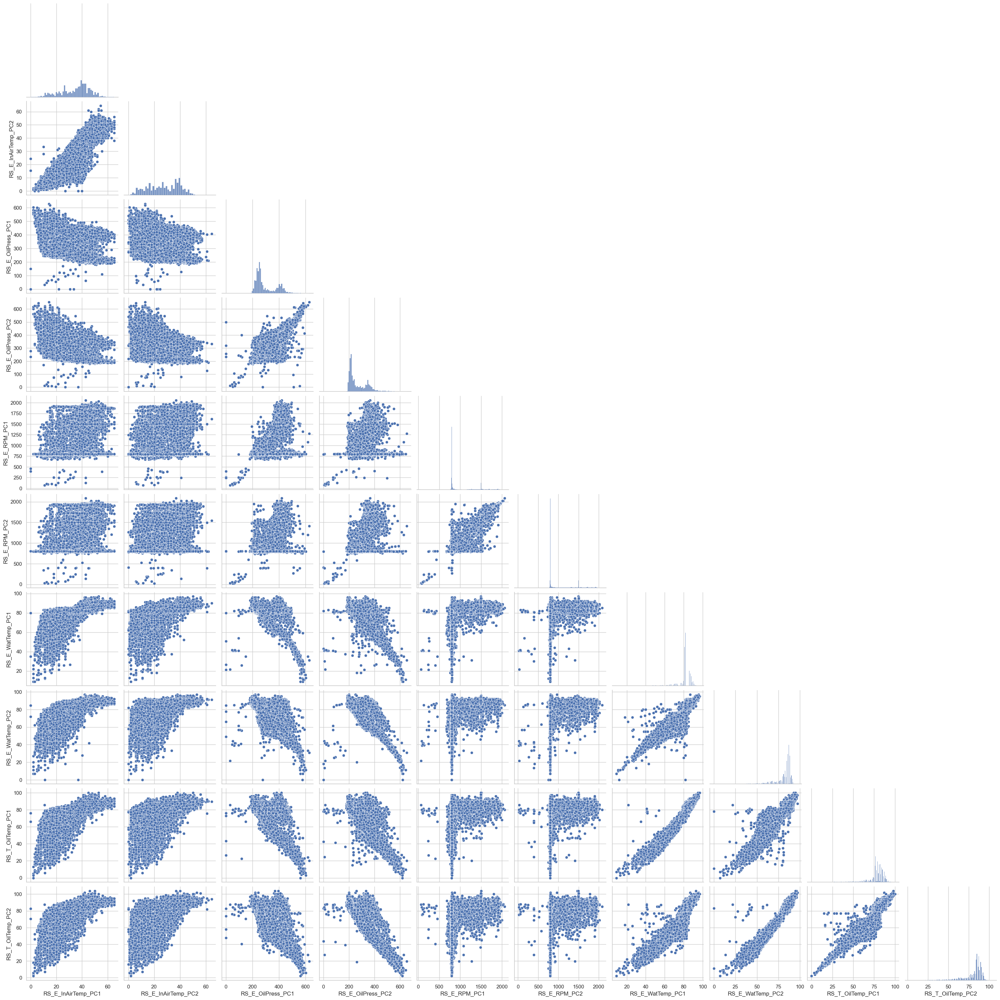

In [7]:
# Create a pair plot

# Subsample data
df_sampled = df_sel[selected_cols_corr].sample(frac=0.1, random_state=1)

sns.set(style="whitegrid")
sns.pairplot(df_sampled, height=3, aspect=1,corner=True)
plt.show()

# Etude des cas where values are 0
- Where all values are zero
- Where atleast one value is zero
- Note: OilPressPC2 have a non-zero (at 20 kPa)

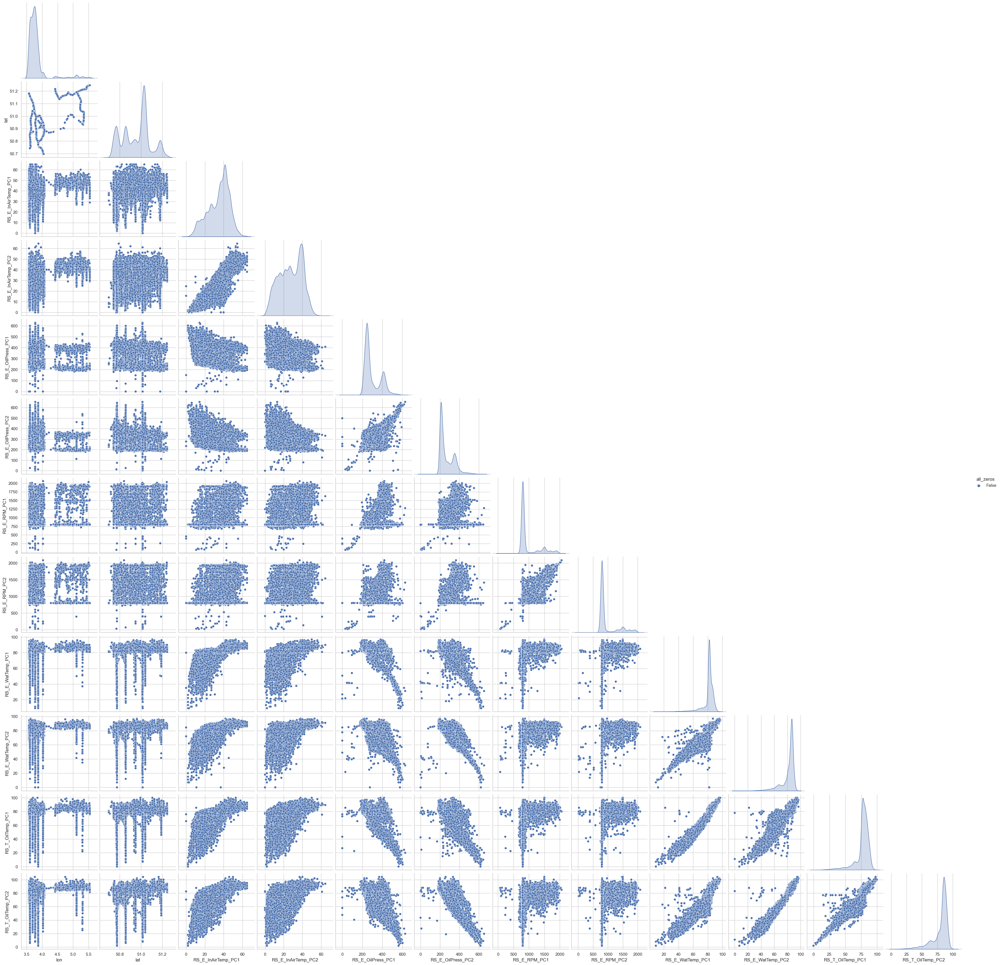

In [59]:
# Subsample data
df_sampled = df_sel.sample(frac=0.1, random_state=1)

df_sampled['all_zeros'] = (df_sampled['RS_E_RPM_PC1'] == 0) & (df_sampled['RS_E_RPM_PC2'] == 0)
#df_sampled['all_zeros'] = (df_sampled['RS_E_InAirTemp_PC1'] == 0) & (df_sampled['RS_E_InAirTemp_PC2'] == 0) & (df_sampled['RS_E_OilPress_PC1'] == 0) & (df_sampled['RS_E_OilPress_PC1'] == 0) & (df_sampled['RS_E_RPM_PC1'] == 0) & (df_sampled['RS_E_RPM_PC2'] == 0)

sns.set(style="whitegrid")
sns.pairplot(df_sampled[selected_cols+['all_zeros']], hue='all_zeros',height=3, aspect=1,corner=True)
plt.show()

In [8]:
# Replace the 20 as a 0 for OilPress2
df_sel['RS_E_OilPress_PC2'] = df_sel['RS_E_OilPress_PC2'].replace(20, 0)

df_sel['zero_columns'] = df_sel.apply(lambda row: row.index[row == 0].tolist(), axis=1)
df_sel['zero_count'] = df_sel.apply(lambda row: (row == 0).sum(), axis=1)
df_sel

C:\Users\mouli\AppData\Local\Temp\ipykernel_22536\2631534327.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sel['RS_E_OilPress_PC2'] = df_sel['RS_E_OilPress_PC2'].replace(20, 0)
C:\Users\mouli\AppData\Local\Temp\ipykernel_22536\2631534327.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sel['zero_columns'] = df_sel.apply(lambda row: row.index[row == 0].tolist(), axis=1)
C:\Users\mouli\AppData\Local\Temp\ipykernel_22536\2631534327.py:5: SettingWithCopyWarning: 
A value is trying to be set on a 

,timestamps_UTC,lon,lat,RS_E_InAirTemp_PC1,RS_E_InAirTemp_PC2,RS_E_OilPress_PC1,RS_E_OilPress_PC2,RS_E_RPM_PC1,RS_E_RPM_PC2,RS_E_WatTemp_PC1,RS_E_WatTemp_PC2,RS_T_OilTemp_PC1,RS_T_OilTemp_PC2,zero_columns,zero_count
0,2023-08-25 08:40:11,4.768149,51.167318,45.0,39.0,420.0,341.0,1837.0,1851.0,88.0,88.0,84.0,87.0,[],0
1,2023-08-25 08:52:14,4.846686,51.188465,43.0,32.0,203.0,200.0,759.0,794.0,84.0,88.0,81.0,87.0,[],0
2,2023-08-02 14:05:52,3.711887,51.034942,42.0,33.0,396.0,338.0,1240.0,1292.0,83.0,87.0,77.0,85.0,[],0
3,2023-08-02 02:08:11,3.871828,50.769412,20.0,18.0,510.0,489.0,801.0,798.0,42.0,46.0,25.0,30.0,[],0
4,2023-08-02 02:57:49,3.872029,50.769818,26.0,22.0,317.0,289.0,801.0,802.0,72.0,71.0,61.0,62.0,[],0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265489,2023-03-02 19:14:43,3.711618,51.035736,28.0,9.0,244.0,217.0,802.0,796.0,81.0,82.0,77.0,84.0,[],0
265490,2023-03-02 21:25:34,3.613172,50.860273,36.0,21.0,224.0,203.0,799.0,802.0,83.0,90.0,84.0,92.0,[],0
265491,2023-03-03 02:32:22,3.606423,50.855451,14.0,5.0,276.0,267.0,797.5,799.5,76.0,71.0,66.0,65.5,[],0
265492,2023-03-03 03:27:23,3.601409,50.851097,11.0,6.0,282.0,262.0,800.0,802.0,72.0,70.0,69.0,69.0,[],0


In [9]:
df_sel['zero_count'].value_counts()

0    250904
2      5825
4      4552
3      2042
8       866
1       851
5       270
6       162
7        20
9         2
Name: zero_count, dtype: int64

In [10]:
df_zeros = df_sel[df_sel['zero_count'] != 0]
df_zeros

,timestamps_UTC,lon,lat,RS_E_InAirTemp_PC1,RS_E_InAirTemp_PC2,RS_E_OilPress_PC1,RS_E_OilPress_PC2,RS_E_RPM_PC1,RS_E_RPM_PC2,RS_E_WatTemp_PC1,RS_E_WatTemp_PC2,RS_T_OilTemp_PC1,RS_T_OilTemp_PC2,zero_columns,zero_count
24,2023-08-23 22:42:39,5.110092,51.189727,65.0,61.0,0.0,0.0,0.0,0.0,81.0,85.0,81.0,83.0,"[RS_E_OilPress_PC1, RS_E_OilPress_PC2, RS_E_RP...",4
69,2023-08-24 22:49:50,5.109457,51.189593,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,82.0,82.0,"[RS_E_InAirTemp_PC1, RS_E_InAirTemp_PC2, RS_E_...",8
82,2023-08-03 16:50:20,3.872476,50.771948,55.0,51.0,0.0,0.0,0.0,0.0,81.0,85.0,79.0,82.0,"[RS_E_OilPress_PC1, RS_E_OilPress_PC2, RS_E_RP...",4
97,2023-08-08 09:45:21,3.774748,51.015900,53.0,51.0,0.0,17.0,0.0,0.0,81.0,57.0,77.0,54.0,"[RS_E_OilPress_PC1, RS_E_RPM_PC1, RS_E_RPM_PC2]",3
143,2023-08-10 12:55:35,3.775222,51.015627,42.0,70.0,238.0,0.0,798.0,0.0,83.0,70.0,79.0,68.0,"[RS_E_OilPress_PC2, RS_E_RPM_PC2]",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
265238,2023-04-18 17:06:02,3.607627,50.856245,42.0,37.0,0.0,0.0,0.0,0.0,81.0,86.0,79.0,83.0,"[RS_E_OilPress_PC1, RS_E_OilPress_PC2, RS_E_RP...",4
265296,2023-01-24 06:50:35,3.775289,51.015586,48.0,47.0,0.0,0.0,0.0,0.0,76.0,78.0,75.0,77.0,"[RS_E_OilPress_PC1, RS_E_OilPress_PC2, RS_E_RP...",4
265330,2023-04-14 08:52:15,4.029082,50.948548,40.5,27.5,0.0,0.0,0.0,0.0,81.0,87.0,80.5,84.0,"[RS_E_OilPress_PC1, RS_E_OilPress_PC2, RS_E_RP...",4
265336,2023-04-21 02:13:17,3.781007,51.013278,30.0,30.0,0.0,17.0,0.0,0.0,27.0,42.0,22.0,30.0,"[RS_E_OilPress_PC1, RS_E_RPM_PC1, RS_E_RPM_PC2]",3


In [12]:
df_zeros['zero_columns'].value_counts(normalize=True).head(10)

[RS_E_OilPress_PC1, RS_E_OilPress_PC2, RS_E_RPM_PC1, RS_E_RPM_PC2]                                                                                0.299109
[RS_E_OilPress_PC1, RS_E_RPM_PC1]                                                                                                                 0.279095
[RS_E_OilPress_PC1, RS_E_RPM_PC1, RS_E_RPM_PC2]                                                                                                   0.127690
[RS_E_OilPress_PC2, RS_E_RPM_PC2]                                                                                                                 0.100891
[RS_E_InAirTemp_PC1, RS_E_InAirTemp_PC2, RS_E_OilPress_PC1, RS_E_OilPress_PC2, RS_E_RPM_PC1, RS_E_RPM_PC2, RS_E_WatTemp_PC1, RS_E_WatTemp_PC2]    0.059356
[RS_E_RPM_PC2]                                                                                                                                    0.050171
[RS_E_RPM_PC1, RS_E_RPM_PC2]                                          

Apres avoir remplace OilPress = 20 par 0, on distingue plusieurs etats:
- Etat standard (94% of data) (aucun 0 dans aucune colonne)
- Etats with atleast one zero (6 %)
    - 2 RPM & 2 OilPress = 0 (30%)
    - OilPress1 & RPM1 = 0 (30%)
    - OilPress1 & 2 RPM = 0 (12%)
    - OilPress2 & RPM2 = 0 (10%)
    - 2 AirTemp + 2 OilPress + 2 RPM + 2 WaterTemp = 0 (6%) -> Cas interessant
    - RPM2 = 0 (5%)
    - RPM1 + RPM2 = 0 (2%)
    - 
    etc...

Les conditions seront surtout sur les RPM et OilPress

# Analyse des cas limites
A la place d'utiliser les cas limites (valeurs de 0), on considere les cas ou les valeurs sont trop basses ou trop hautes

In [ ]:
# Filtre 1 : Supprimer les valeurs aberrantes = impossible
from cool_train.data_cleaning import filter_impossible_values



# Histogram for each Variable

In [48]:
import pandas as pd
import plotly.subplots as sp
import plotly.graph_objects as go

# Assuming df_sel is your DataFrame
df_sel = df[selected_cols]

# Check the size of the DataFrame
num_rows, num_columns = df_sel.shape

# Set a threshold for the number of points beyond which you want to subsample
threshold_rows = 10000

# Check the size of the DataFrame
num_rows, num_columns = df_sel.shape

if num_rows < threshold_rows:
    # If the number of rows is less than the threshold, use the entire DataFrame
    df_sample = df_sel.sample(n=num_rows // num_columns * num_columns)
else:
    # If the number of points is too large, subsample the DataFrame
    df_sample = df_sel.sample(n=threshold_rows)

# Create subplots in a 7x7 grid
fig = sp.make_subplots(rows=4, cols=4, subplot_titles=list(df_sample.columns))

# Populate subplots with histograms
for i, column in enumerate(df_sample.columns, 1):
    row_num = (i - 1) // 4 + 1
    col_num = (i - 1) % 4 + 1
    hist_data = df_sample[column]
    histogram = go.Histogram(x=hist_data, nbinsx=100, name=column)
    fig.add_trace(histogram, row=row_num, col=col_num)

# Update layout
fig.update_layout(
    title_text="Histograms for Each Variable",
    showlegend=False,
    height=1000, 
    width=1000  
)
# Show the plot
fig.show()
